In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize,sent_tokenize
nltk.download('punkt')
nltk.download('stopwords')
from nltk.stem import PorterStemmer

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
import pandas as pd

train = pd.read_csv('/kaggle/input/genre-classification-dataset-imdb/Genre Classification Dataset/train_data.txt', sep=':::', engine='python', names=['Id', 'Title','Genre' ,'Description'])
test = pd.read_csv('/kaggle/input/genre-classification-dataset-imdb/Genre Classification Dataset/test_data.txt', sep=':::', engine='python', names=['Id', 'Title', 'Description'])


In [4]:
train.head()

,Id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [5]:
train.Genre.unique()

array([' drama ', ' thriller ', ' adult ', ' documentary ', ' comedy ',
       ' crime ', ' reality-tv ', ' horror ', ' sport ', ' animation ',
       ' action ', ' fantasy ', ' short ', ' sci-fi ', ' music ',
       ' adventure ', ' talk-show ', ' western ', ' family ', ' mystery ',
       ' history ', ' news ', ' biography ', ' romance ', ' game-show ',
       ' musical ', ' war '], dtype=object)

In [6]:
train.shape

(54214, 4)

In [7]:
len(train.Genre.unique())

27

In [8]:
import re
import string

def clean_words(text):
    text = text.lower()
    sentences = sent_tokenize(text)
    sw = set(stopwords.words('english'))
    stemmer = PorterStemmer()  # Initialize the stemmer
    list_words = [word_tokenize(sentence) for sentence in sentences]
    
    cleaned_words = [
        re.sub(r'-(?=\w)', ' ', stemmer.stem(word))
        for words in list_words
        for word in words
        if word not in sw and word not in string.punctuation
    ]
    
    return " ".join(cleaned_words)

In [9]:
train['Clean Words']=train['Description'].apply(clean_words)

In [10]:
train.head()

,Id,Title,Genre,Description,Clean Words
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listen convers doctor parent 10 year old oscar...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestu relationship curre...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bu empti student field trip museum natur histo...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemploy father make end meet edith twin ...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,film 's titl refer un recov bodi ground zero a...


# EDA

In [11]:
def plotpie(train):
    genre_counts = train['Genre'].value_counts()
    wedges, texts, autotexts = plt.pie(genre_counts, labels=None, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.legend(wedges, genre_counts.index, title='Genres', loc='best')
    plt.title('Distribution of Genres')
    plt.show()

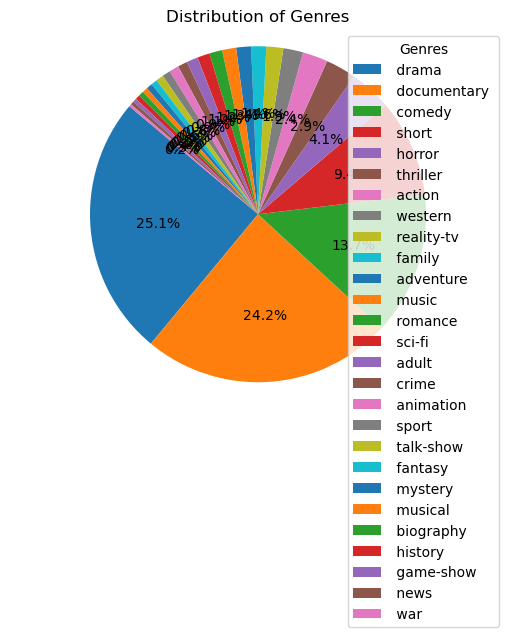

In [12]:
plotpie(train)

### Result : We can clearly see that data is imbalanced , it can definitely affect our model , first thing we will do is to go without balancing , after that we will balance this dataset , after that we will merge some similar categories

In [13]:
from wordcloud import WordCloud

### I am generating the word clouds because in the end I have to merge the similar categories, I have generated so we can see which one are similar

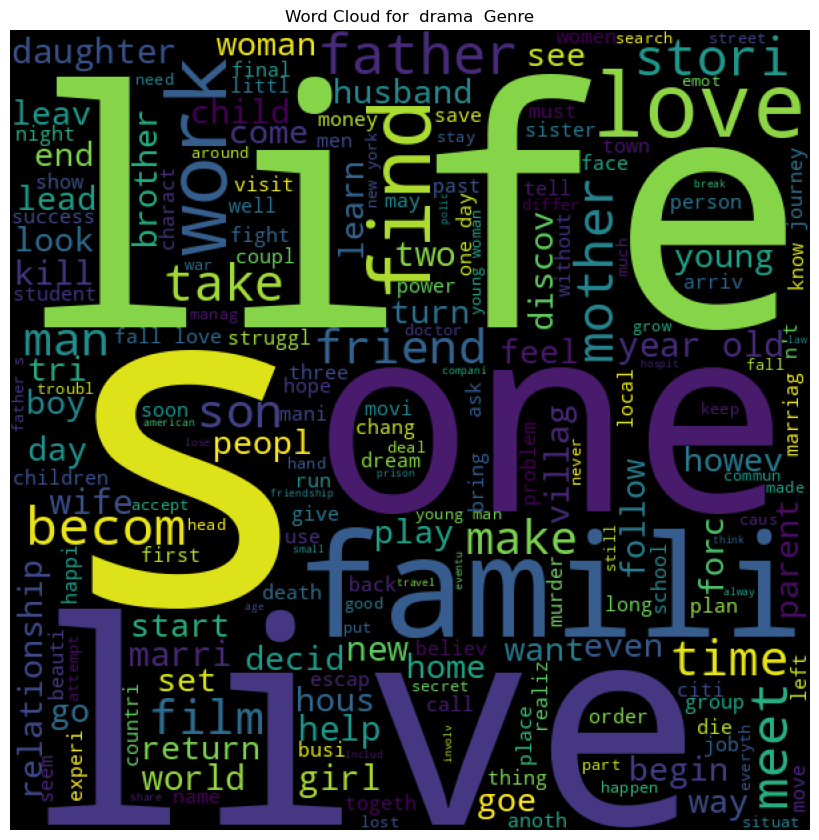

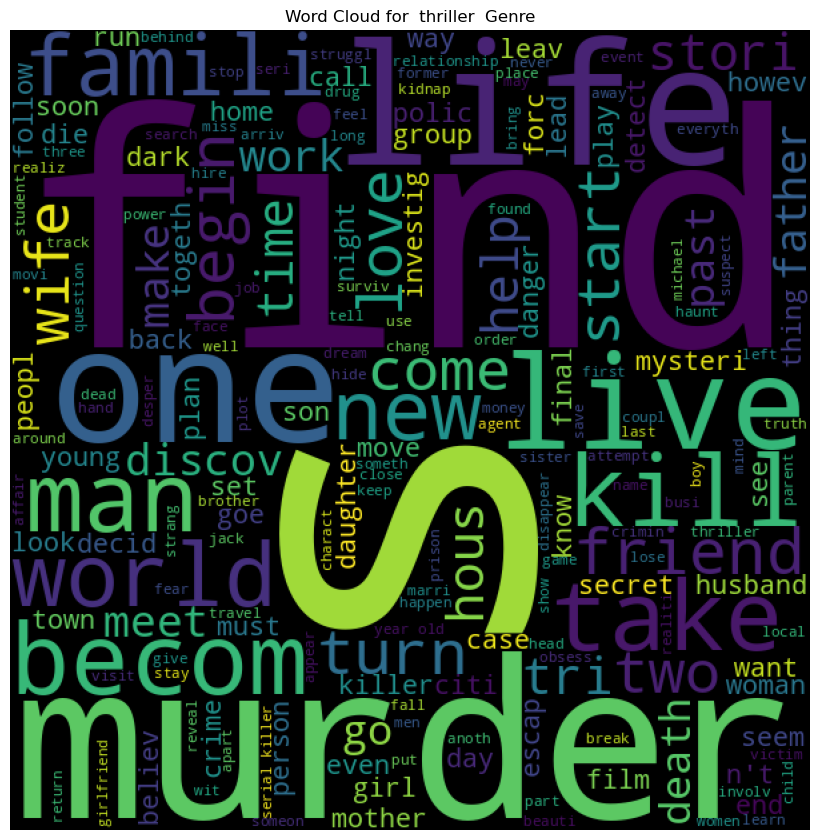

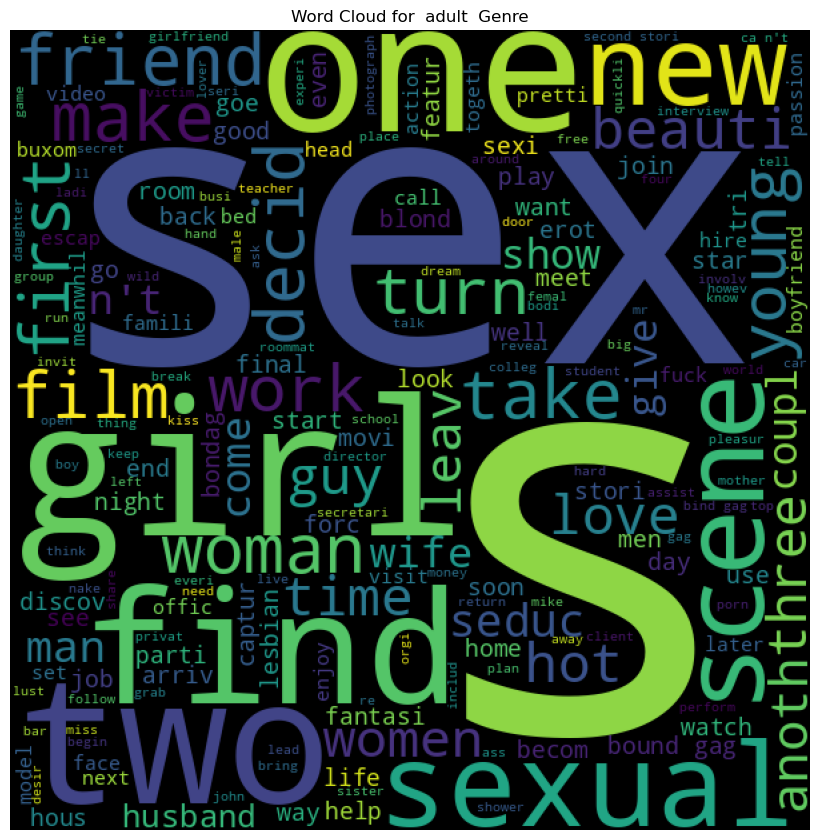

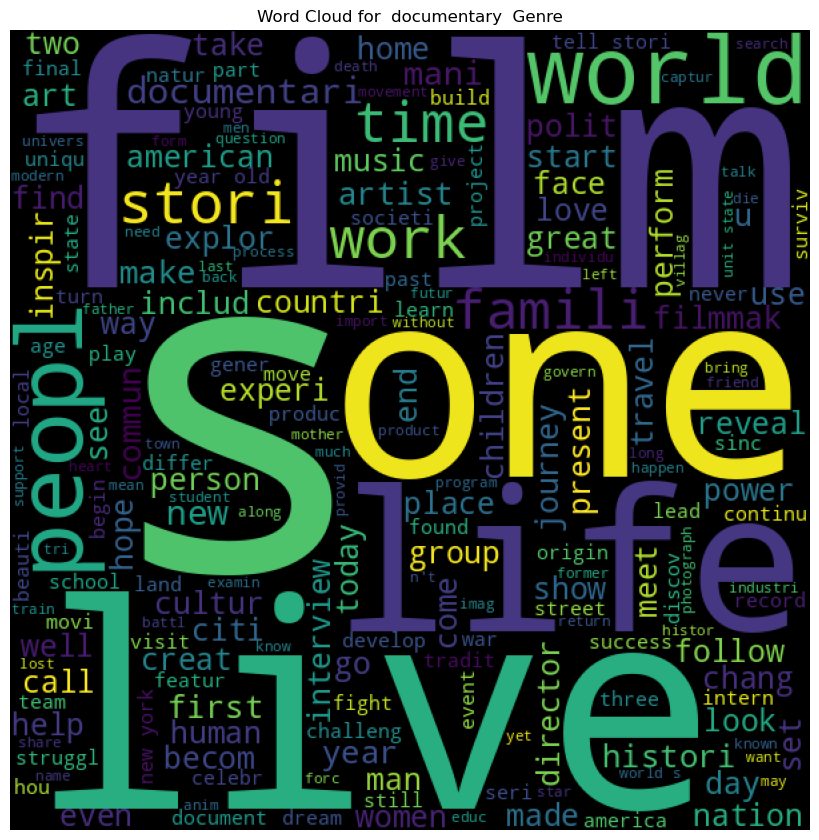

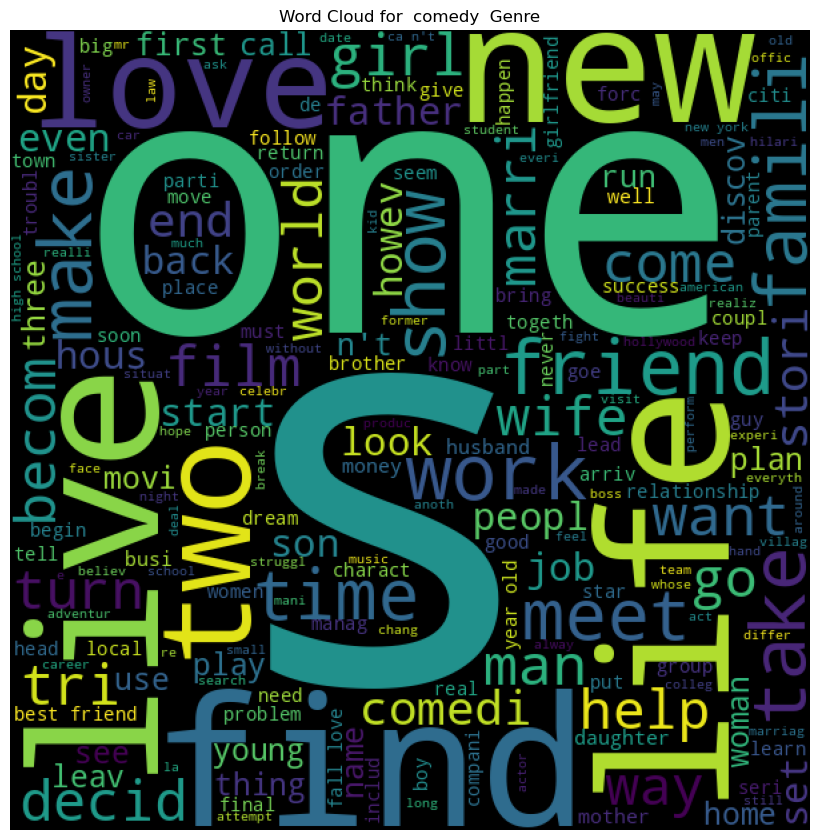

...

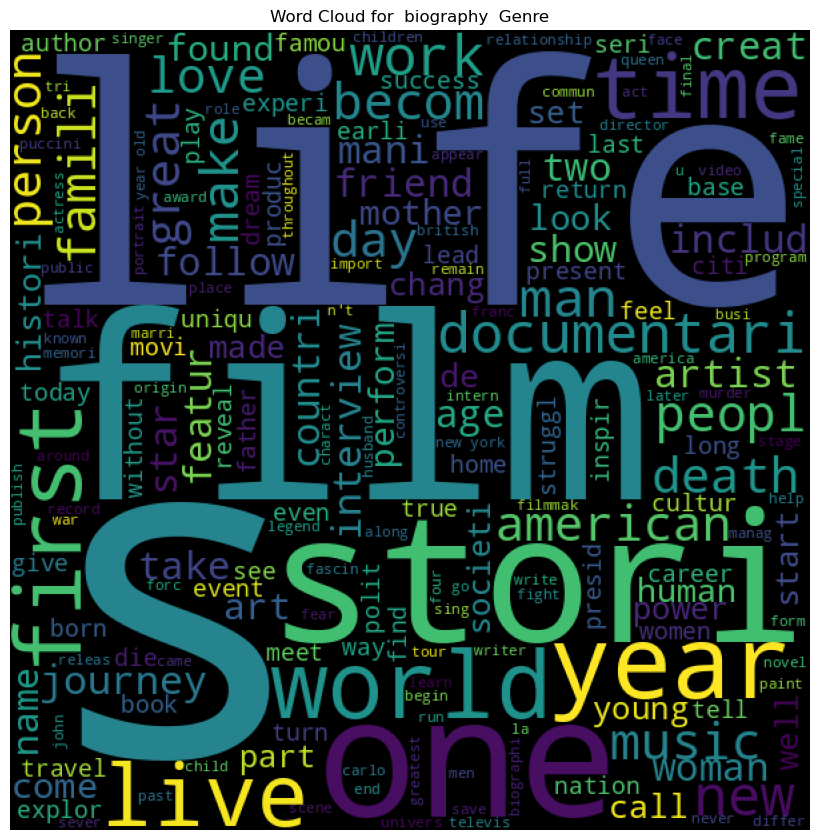

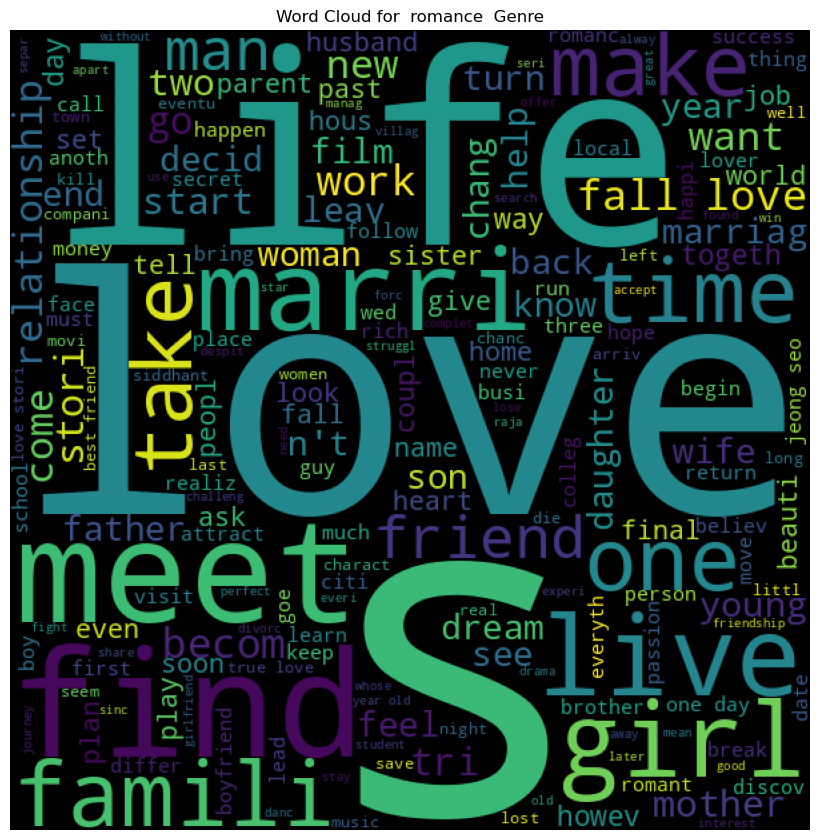

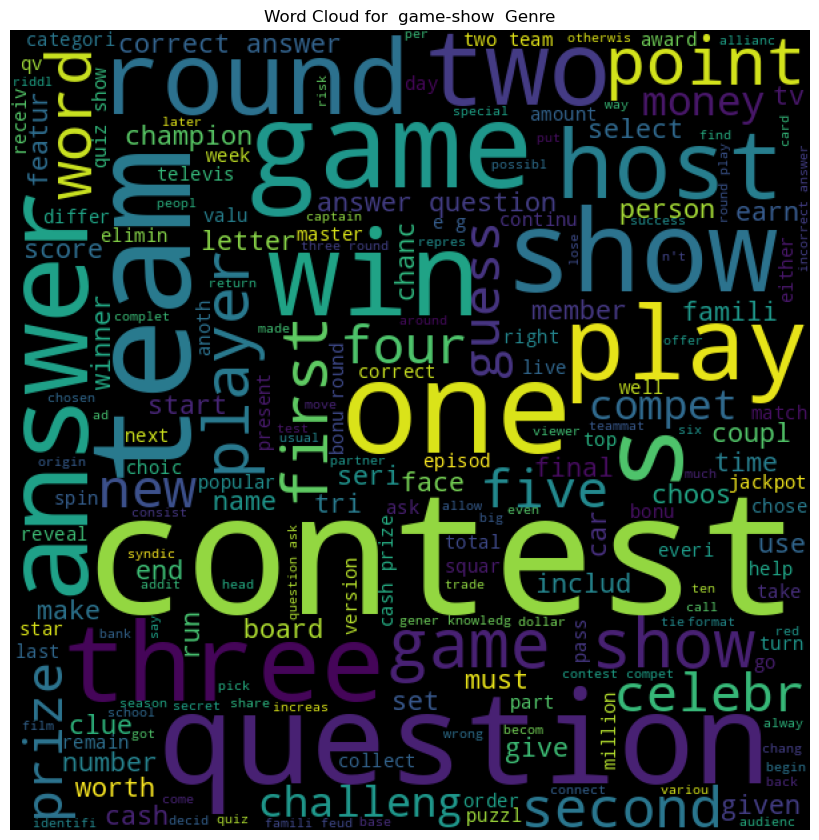

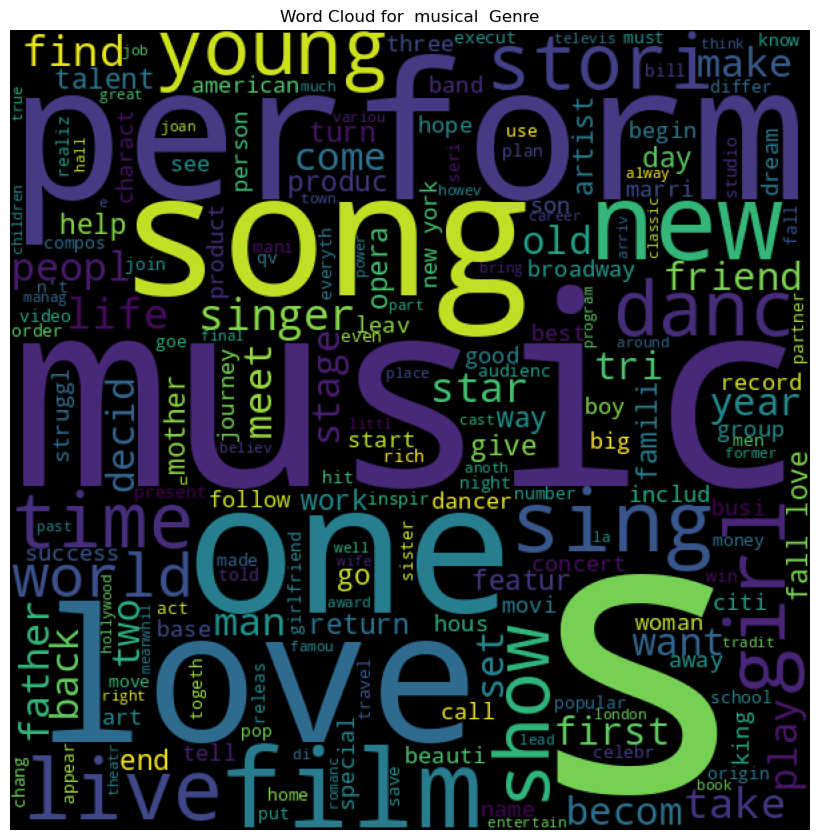

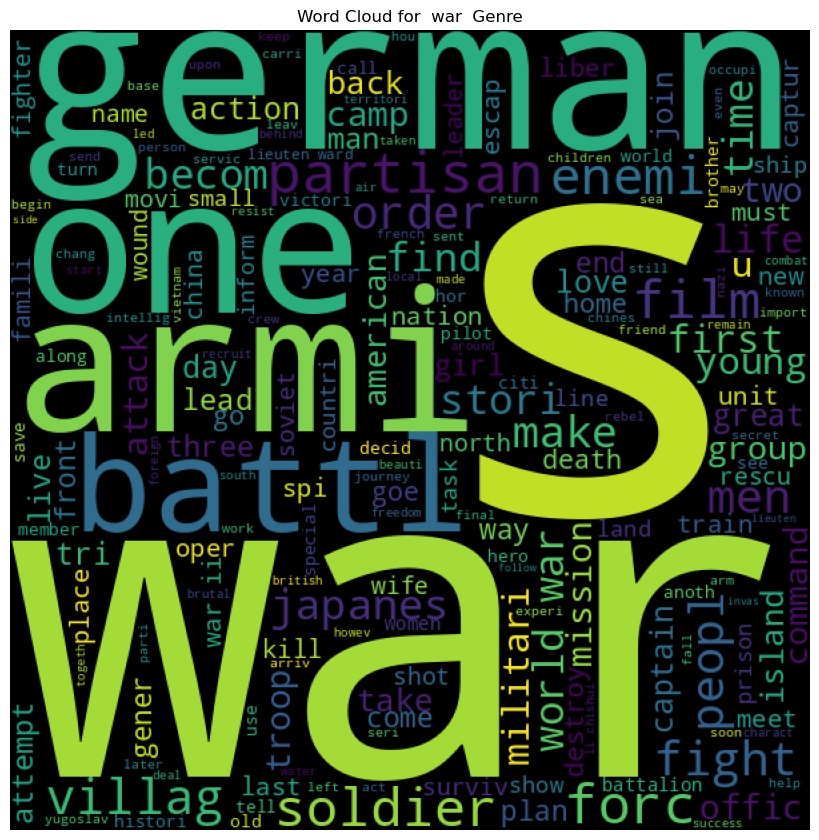

In [14]:
# Create a WordCloud for each genre
for genre in train['Genre'].unique():
    genre_descriptions = ' '.join(train[train['Genre'] == genre]['Clean Words'])   
    wordcloud = WordCloud(width=600, height=600, background_color='black').generate(genre_descriptions)
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.title(f'Word Cloud for {genre} Genre')
    plt.show()

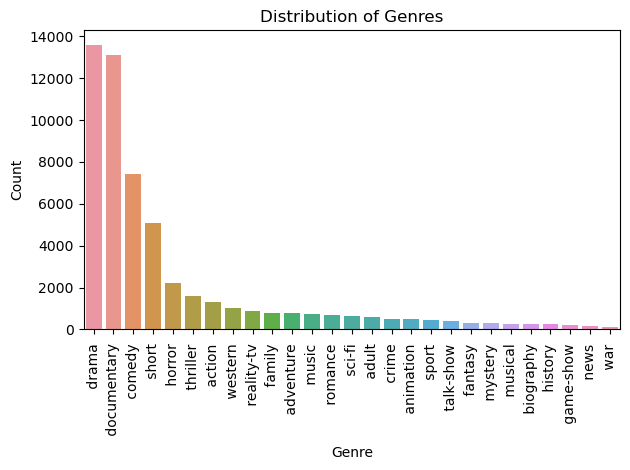

In [15]:
sns.barplot(x=train['Genre'].value_counts().index, y=train['Genre'].value_counts())
plt.xlabel('Genre')
plt.ylabel('Count')
plt.title('Distribution of Genres')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()

plt.show()

In [16]:
tokenized_sentences = []
for description in train['Clean Words']:
    sentences = sent_tokenize(description)  # Split description into sentences
    for sentence in sentences:
        words = word_tokenize(sentence.lower())  # Tokenize sentence into words
        tokenized_sentences.append(words)

In [17]:
tokenized_sentences[:2]

[['listen',
  'convers',
  'doctor',
  'parent',
  '10',
  'year',
  'old',
  'oscar',
  'learn',
  'nobodi',
  'courag',
  'tell',
  'week',
  'live',
  'furiou',
  'refus',
  'speak',
  'anyon',
  'except',
  'straight',
  'talk',
  'rose',
  'ladi',
  'pink',
  'meet',
  'hospit',
  'stair',
  'christma',
  'approach',
  'rose',
  'use',
  'fantast',
  'experi',
  'profession',
  'wrestler',
  'imagin',
  'wit',
  'charm',
  'allow',
  'oscar',
  'live',
  'life',
  'love',
  'full',
  'compani',
  'friend',
  'pop',
  'corn',
  'einstein',
  'bacon',
  'childhood',
  'sweetheart',
  'peggi',
  'blue'],
 ['brother',
  'sister',
  'past',
  'incestu',
  'relationship',
  'current',
  'murder',
  'relationship',
  'murder',
  'women',
  'reject',
  'murder',
  'women',
  'get',
  'close']]

In [18]:
from gensim.models import Word2Vec

In [19]:
word2vec_model = Word2Vec(sentences=tokenized_sentences, vector_size=100, window=5, min_count=1, workers=4)

In [20]:
word2vec_model.wv.get_vector('scar')

array([ 1.44813091e-01,  4.60600495e-01,  3.59339505e-01, -1.40840366e-01,
       -4.63974088e-01, -4.58713353e-01,  1.38052836e-01,  3.93784717e-02,
        4.21768606e-01, -5.81564456e-02,  2.90605247e-01,  1.51200309e-01,
       -3.25772882e-01, -2.57861644e-01, -4.38861251e-01, -3.49533446e-02,
        1.63722813e-01, -6.04616821e-01,  1.64701417e-01, -6.92009211e-01,
        8.06226313e-01,  1.07251072e+00,  5.01894951e-01,  9.51052904e-02,
       -7.30786085e-01,  2.51217604e-01, -1.76938653e-01, -6.88295305e-01,
        2.55064722e-02,  8.94278958e-02,  2.88477808e-01,  9.37353194e-01,
        5.28511941e-01,  1.45358458e-01, -6.39907658e-01,  7.60086238e-01,
       -2.38978133e-01, -2.47222483e-01,  5.67036450e-01, -6.27204418e-01,
        9.30151820e-01, -5.29263079e-01,  1.13459654e-01,  2.57471621e-01,
        3.36791337e-01,  9.68542881e-04, -4.14038569e-01,  5.43592215e-01,
        1.49537593e-01,  1.84817929e-02,  2.08226219e-02, -1.12399645e-01,
        4.34330821e-01, -

In [21]:
def get_word_embeddings(text, model):
    embeddings = []
    for word in text:
        if word in model.wv:
            embeddings.append(model.wv[word])
    return embeddings

def get_mean_embeddings(text, model, remove_stopwords=True):
    tokens = word_tokenize(text.lower())
    embeddings = get_word_embeddings(tokens, model)
    if embeddings:
        mean_embedding = np.mean(embeddings, axis=0)
    else:
        mean_embedding = np.zeros(model.vector_size)
    return mean_embedding

In [22]:
train['embeddings'] = train['Description'].apply(lambda x: get_mean_embeddings(x, word2vec_model))

In [23]:
train.head()

,Id,Title,Genre,Description,Clean Words,embeddings
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listen convers doctor parent 10 year old oscar...,"[-0.162998, 0.072143845, -0.0056993775, -0.123..."
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestu relationship curre...,"[-0.24815181, 0.05059617, 0.004082982, -0.1646..."
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bu empti student field trip museum natur histo...,"[-0.22688901, 0.20415886, 0.23287615, -0.11721..."
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemploy father make end meet edith twin ...,"[0.02320936, 0.118201345, -0.07157854, -0.0058..."
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,film 's titl refer un recov bodi ground zero a...,"[-0.29586387, 0.20053667, 0.19583854, -0.42266..."


In [24]:
from sklearn.preprocessing import LabelEncoder

In [25]:
encoder=LabelEncoder()
train['Genre_encoded']=encoder.fit_transform(train['Genre'])

In [26]:
train.head()

,Id,Title,Genre,Description,Clean Words,embeddings,Genre_encoded
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listen convers doctor parent 10 year old oscar...,"[-0.162998, 0.072143845, -0.0056993775, -0.123...",8
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestu relationship curre...,"[-0.24815181, 0.05059617, 0.004082982, -0.1646...",24
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bu empti student field trip museum natur histo...,"[-0.22688901, 0.20415886, 0.23287615, -0.11721...",1
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemploy father make end meet edith twin ...,"[0.02320936, 0.118201345, -0.07157854, -0.0058...",8
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,film 's titl refer un recov bodi ground zero a...,"[-0.29586387, 0.20053667, 0.19583854, -0.42266...",8


In [27]:
test.head()

,Id,Title,Description
0,1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),Before he was known internationally as a mart...


In [28]:
test['Clean Words']=test['Description'].apply(clean_words)

In [29]:
test.head()

,Id,Title,Description,Clean Words
0,1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar...",l.r brane love life car apart job especi girlf...
1,2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch...",spain march 1964 quico naughti child three bel...
2,3,Off the Beaten Track (2010),One year in the life of Albin and his family ...,one year life albin famili shepherd north tran...
3,4,Meu Amigo Hindu (2015),"His father has died, he hasn't spoken with hi...",father die n't spoken brother 10 year seriou c...
4,5,Er nu zhai (1955),Before he was known internationally as a mart...,known intern martial art superstar bruce lee a...


In [30]:
test['embeddings'] = test['Description'].apply(lambda x: get_mean_embeddings(x, word2vec_model))

In [31]:
test.head()

,Id,Title,Description,Clean Words,embeddings
0,1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar...",l.r brane love life car apart job especi girlf...,"[-0.03615282, 0.006317211, 0.1584805, -0.10108..."
1,2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch...",spain march 1964 quico naughti child three bel...,"[0.120751426, 0.13666838, 0.051115368, 0.00015..."
2,3,Off the Beaten Track (2010),One year in the life of Albin and his family ...,one year life albin famili shepherd north tran...,"[-0.1522769, 0.14415464, 0.11675751, -0.409765..."
3,4,Meu Amigo Hindu (2015),"His father has died, he hasn't spoken with hi...",father die n't spoken brother 10 year seriou c...,"[-0.027554188, 0.0069206096, 0.13474491, -0.01..."
4,5,Er nu zhai (1955),Before he was known internationally as a mart...,known intern martial art superstar bruce lee a...,"[-0.16077438, 0.16449448, 0.11896198, -0.04527..."


## Training and Test clean dataset 

In [32]:
x_train=np.vstack(train['embeddings'])
y_train=train['Genre_encoded'].values

In [33]:
x_test=np.vstack(test['embeddings'])

In [34]:
x_test[:2]

array([[-3.61528210e-02,  6.31721085e-03,  1.58480495e-01,
        -1.01084821e-01, -9.81919914e-02, -6.75106645e-01,
         4.58924137e-02,  9.17321503e-01, -5.04224673e-02,
        -2.53061444e-01,  5.50002195e-02, -6.23429954e-01,
        -6.55206367e-02,  1.69308826e-01,  3.28511685e-01,
        -5.49199402e-01,  3.74398440e-01, -1.58923000e-01,
        -1.90382898e-02, -5.11397421e-01,  1.71250269e-01,
         5.63396737e-02,  2.34660491e-01, -2.35001277e-02,
        -4.07315195e-01,  5.92324324e-02,  1.01109661e-01,
        -1.52196169e-01, -4.10557911e-02, -1.55889541e-01,
         1.05525374e-01, -1.44300431e-01, -1.70680791e-01,
        -3.78029376e-01, -7.38948211e-02,  1.80141926e-01,
         4.51987714e-01, -3.23547721e-01, -2.72314996e-01,
         2.16504350e-01,  1.60254911e-01, -1.22191921e-01,
        -1.20764039e-01, -1.21412873e-01,  3.60823750e-01,
         1.00390740e-01, -1.78759307e-01, -7.09829107e-02,
        -2.29124740e-01,  5.95112517e-02, -1.20153315e-0

In [35]:
y_test=pd.read_csv('/kaggle/input/genre-classification-dataset-imdb/Genre Classification Dataset/test_data_solution.txt', sep=':::', engine='python', names=['Id', 'Title','Genre' ,'Description'])

In [36]:
y_test.head()

,Id,Title,Genre,Description
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


In [37]:
y_test_=encoder.transform(y_test['Genre'])

In [38]:
type(y_test_)

numpy.ndarray

In [39]:
from sklearn.naive_bayes import MultinomialNB,GaussianNB,BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier

In [40]:

mnb = MultinomialNB()
gnb = GaussianNB()
bnb = BernoulliNB()
svc = SVC()
knc = KNeighborsClassifier()
lr = LogisticRegression(solver='sgd', penalty='l1')
dtc = DecisionTreeClassifier(max_depth=5)
rfc = RandomForestClassifier(n_estimators=50, random_state=2)
abc = AdaBoostClassifier(n_estimators=50, random_state=2)
xgb = XGBClassifier(n_estimators=50,random_state=2)
bc = BaggingClassifier(n_estimators=50, random_state=2)
etc = ExtraTreesClassifier(n_estimators=50, random_state=2)
     

In [41]:
x_train.shape

(54214, 100)

In [42]:
rfc.fit(x_train,y_train)

RandomForestClassifier(n_estimators=50, random_state=2)

In [43]:
y_pred=rfc.predict(x_test)

In [44]:
from sklearn.metrics import classification_report,accuracy_score

In [45]:
accuracy_score(y_test_,y_pred)

0.44105166051660516

In [46]:
print(classification_report(y_test_,y_pred))

              precision    recall  f1-score   support

           0       0.28      0.03      0.05      1314
           1       0.17      0.00      0.00       590
           2       0.13      0.00      0.01       775
           3       0.25      0.00      0.00       498
           4       0.00      0.00      0.00       264
           5       0.32      0.35      0.34      7446
           6       1.00      0.00      0.01       505
           7       0.50      0.81      0.62     13096
           8       0.43      0.68      0.53     13612
           9       0.80      0.02      0.03       783
          10       0.00      0.00      0.00       322
          11       0.89      0.33      0.48       193
          12       0.00      0.00      0.00       243
          13       0.36      0.12      0.18      2204
          14       0.50      0.16      0.24       731
          15       0.86      0.02      0.04       276
          16       1.00      0.00      0.01       318
          17       0.00    

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Lets try out TFIDF

In [47]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [48]:
tfidf=TfidfVectorizer(min_df = 5)

In [49]:
x_train_tf=tfidf.fit_transform(train['Clean Words'])

In [50]:
x_train_tf=x_train_tf.toarray()

In [51]:
x_test_tf=tfidf.transform(test['Clean Words'])

In [52]:
x_test_tf=x_test_tf.toarray()

In [53]:
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score

In [54]:
# algos={
#     'BNB':bnb,
#     'GNB':gnb,
#     'MNB':mnb,
#     'SVC':svc,
#     'KNC':knc,
#     'LR':lr,
#     'DTC':dtc,
#     'RFC':rfc,
#     'ABC':abc,
#     'XGB':xgb,
#     'BC':bc,
#     'ETC':etc
# }

In [55]:
# pre_acc = {}
# for name,algo in algos.items():
#     algo.fit(x_train_tf, y_train)
#     y_pred = algo.predict(x_test_tf)
#     pre_acc[name] = {
#         'Precision': precision_score(y_test, y_pred,average='weighted'),
#         'Accuracy': accuracy_score(y_test, y_pred),
#         'Confusion Matrix': confusion_matrix(y_test, y_pred)
#     }

In [56]:
mnb.fit(x_train_tf,y_train)

MultinomialNB()

In [57]:
ypred=mnb.predict(x_test_tf)

In [58]:
accuracy_score(y_test_, ypred)

0.48154981549815495

In [ ]:
rfc.fit(x_train_tf,y_train)

In [60]:
ypred_rfc=rfc.predict(x_test_tf)

In [61]:
accuracy_score(y_test_, ypred_rfc)

0.4880442804428044

## We have tried both embeddings and TFIDF but accuracy is not increasing 
### Reason: 
### 1. Our dataset is imbalanced
### 2. Not to large corpus to train embeddings on 
### So lets take care of the 1st one and make each category equall , we will lose amount of data but lets see if we make any improvement ,we will do downsampling technique

## Lets downsample our data

In [62]:
max_samples = 1500
downsampled_data = train.groupby('Genre').apply(lambda x: x.sample(min(max_samples, len(x))))
downsampled_data.reset_index(drop=True, inplace=True)

In [63]:
downsampled_data.head()

,Id,Title,Genre,Description,Clean Words,embeddings,Genre_encoded
0,31103,Yaowarat (2003),action,Kao is a gunman for the Pahurad gang. He ends...,kao gunman pahurad gang end kill member rival ...,"[-0.030548504, 0.09749424, 0.29151112, -0.1969...",0
1,3780,Cobraman Movie (????),action,"The is a story about a disabled teenage boy, ...",stori disabl teenag boy russel wilson bitten c...,"[-0.28412217, 0.08045805, 0.18491574, -0.11539...",0
2,43189,Hindi pa tapos ang laban (1994),action,"Fernando Poe Jr. stars as Carding Villamar, a...",fernando poe jr. star card villamar citi profe...,"[-0.06376075, 0.10658315, 0.1286265, -0.113011...",0
3,14919,Hunting for the Icon (2013),action,The Film tells the story about a priceless ic...,film tell stori priceless icon stolen church r...,"[-0.27505222, 0.16137712, 0.20560993, -0.35708...",0
4,5304,Thug in Love (????),action,"After a near fatal car accident, notorious mo...",near fatal car accid notori mob heavi lester h...,"[-0.09461668, 0.15714532, 0.07937472, -0.15965...",0


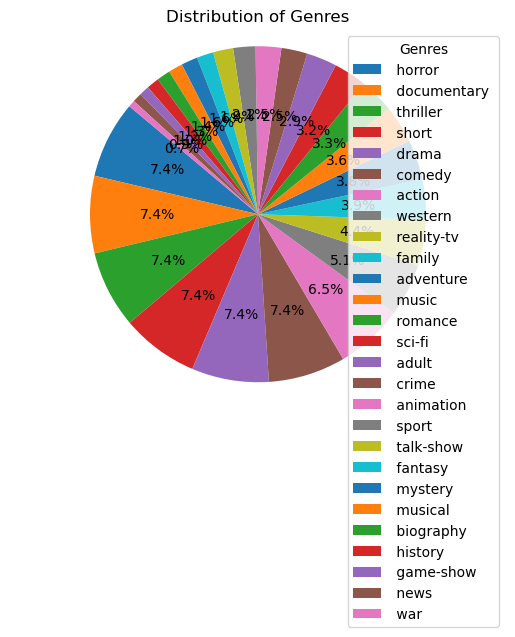

In [64]:
plotpie(downsampled_data)

In [65]:
downsampled_data.shape

(20190, 7)

In [66]:
x_train_down=np.vstack(downsampled_data['embeddings'])
y_train_down=downsampled_data['Genre_encoded']

In [67]:
rfc_down= RandomForestClassifier(n_estimators=50, random_state=2)

In [68]:
rfc_down.fit(x_train_down,y_train_down)

RandomForestClassifier(n_estimators=50, random_state=2)

In [69]:
x_train_down.shape

(20190, 100)

In [70]:
x_test.shape

(54200, 100)

In [71]:
ypred_down=rfc_down.predict(x_test)

In [72]:
accuracy_score(y_test_,ypred_down)

0.3490221402214022

## Results:  Accuracy decreased with downsampling so lets try last and final step

In [73]:
train['Genre']=train['Genre'].apply(lambda x :  x.strip())

In [74]:
def create_genre_new(text):
    cats = [
    ['drama', 'mystery', 'thriller'],
    ['reality-tv', 'short', 'talk-show', 'game-show','family'],
    ['action', 'crime', 'war'],
    ['fantasy', 'sci-fi', 'adventure'],
    ['history', 'news', 'biography','documentary'],
    ['music', 'musical']
    ]
    for cat in cats:
        if text in cat:
            return cat
    return text

In [75]:
th_d_mystery = train.copy()
    
th_d_mystery['genre_new']= th_d_mystery['Genre'].apply(create_genre_new)

In [77]:
y_test['Genre']=y_test['Genre'].apply(lambda x :  x.strip())

In [78]:
y_test['genre_new']=y_test['Genre'].apply(create_genre_new)

In [79]:
len(th_d_mystery['genre_new'].value_counts())

13

In [80]:
y_test['genre_new'].value_counts()

[drama, mystery, thriller]                           15520
[history, news, biography, documentary]              13784
comedy                                                7446
[reality-tv, short, talk-show, game-show, family]     7322
horror                                                2204
[action, crime, war]                                  1951
[fantasy, sci-fi, adventure]                          1743
western                                               1032
[music, musical]                                      1007
romance                                                672
adult                                                  590
animation                                              498
sport                                                  431
Name: genre_new, dtype: int64

In [81]:
def merge_with_pipe(arr):
    if isinstance(arr,list):
        return '|'.join(arr)
    else:
        return "".join(arr)

# Apply the function only to rows with arrays
th_d_mystery['genres'] = th_d_mystery['genre_new'].apply(merge_with_pipe)

In [82]:
y_test['genres']=y_test['genre_new'].apply(merge_with_pipe)

In [83]:
y_test['genres'].unique()

array(['drama|mystery|thriller', 'comedy',
       'history|news|biography|documentary', 'horror',
       'reality-tv|short|talk-show|game-show|family', 'western', 'sport',
       'romance', 'action|crime|war', 'adult', 'music|musical',
       'animation', 'fantasy|sci-fi|adventure'], dtype=object)

In [84]:
th_d_mystery['genres'].unique()

array(['drama|mystery|thriller', 'adult',
       'history|news|biography|documentary', 'comedy', 'action|crime|war',
       'reality-tv|short|talk-show|game-show|family', 'horror', 'sport',
       'animation', 'fantasy|sci-fi|adventure', 'music|musical',
       'western', 'romance'], dtype=object)

In [85]:
train_new=th_d_mystery.copy()

In [86]:
train_new['new_genre_encoded']=encoder.fit_transform(th_d_mystery['genres'])

In [87]:
train_new.head()

,Id,Title,Genre,Description,Clean Words,embeddings,Genre_encoded,genre_new,genres,new_genre_encoded
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listen convers doctor parent 10 year old oscar...,"[-0.162998, 0.072143845, -0.0056993775, -0.123...",8,"[drama, mystery, thriller]",drama|mystery|thriller,4
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestu relationship curre...,"[-0.24815181, 0.05059617, 0.004082982, -0.1646...",24,"[drama, mystery, thriller]",drama|mystery|thriller,4
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bu empti student field trip museum natur histo...,"[-0.22688901, 0.20415886, 0.23287615, -0.11721...",1,adult,adult,1
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemploy father make end meet edith twin ...,"[0.02320936, 0.118201345, -0.07157854, -0.0058...",8,"[drama, mystery, thriller]",drama|mystery|thriller,4
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,film 's titl refer un recov bodi ground zero a...,"[-0.29586387, 0.20053667, 0.19583854, -0.42266...",8,"[drama, mystery, thriller]",drama|mystery|thriller,4


In [88]:
rfc_new=RandomForestClassifier(n_estimators=50, random_state=2)

In [89]:
y_train_new=train_new['new_genre_encoded']

In [95]:
y_train_new

0        4
1        4
2        1
3        4
4        4
        ..
54209    3
54210    7
54211    6
54212    3
54213    6
Name: new_genre_encoded, Length: 54214, dtype: int64

In [94]:
y_test_new=encoder.transform(y_test['genres'])

In [96]:
rfc_new.fit(x_train_tf,y_train_new)

RandomForestClassifier(n_estimators=50, random_state=2)

In [99]:
ypred_new=rfc_new.predict(x_test_tf)

In [102]:
accuracy_score(y_test_new,ypred_new)

0.5261070110701107

## We can see the accuracy is fairly increased about 5% from last tfidf technique with full labels and 10% from embedding vector with full labels 

In [103]:
# now lets train model with those embeddings but with least label technique
rfc_new_new=RandomForestClassifier(n_estimators=50, random_state=2)

In [104]:
rfc_new_new.fit(x_train,y_train_new)

RandomForestClassifier(n_estimators=50, random_state=2)

In [105]:
y_pred_new=rfc_new_new.predict(x_test)

In [106]:
accuracy_score(y_test_new,y_pred_new)

0.47702952029520296

# Results: 
## we will second last technique with less labels and TFIDF